In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('insurance_claims.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df.shape

(1000, 40)

We have 1000 rows and 40 columns.

In [4]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

We have int type values in months as customer, age policy number, policy deductable, umbrella limit, insured zip, capital gains, capital loss, incident hour of the day, number of vehicles involved, bodily injuries, witnesses, total claim amount, injury claim, property claim, vehicle claim and auto year columns. We have float type values in policy annual premium and c39 columns where as object type values are present in rest other columns.

# To check missing values

In [5]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

Here, there are missing values present in _c39 column.

In [6]:
df.drop('_c39',axis=1,inplace=True)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [7]:
df.shape

(1000, 39)

I have dropped _c39 column since it has all the missing values present in it.

Now, we have 1000 rows and 39 columns.

In [8]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

Now, there are no missing values.

<AxesSubplot:>

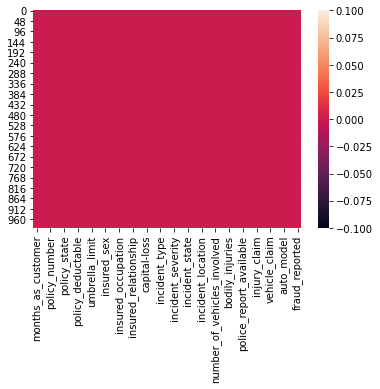

In [9]:
sns.heatmap(df.isnull())

# EDA

In [10]:
df['insured_hobbies'].value_counts()

reading           64
paintball         57
exercise          57
bungie-jumping    56
camping           55
golf              55
movies            55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64

<AxesSubplot:xlabel='policy_state', ylabel='count'>

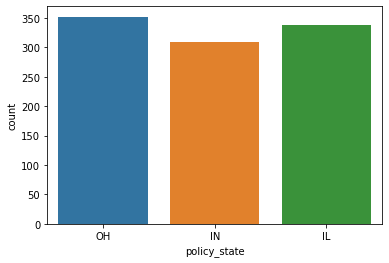

In [11]:
sns.countplot(df['policy_state'])

<AxesSubplot:xlabel='policy_csl', ylabel='count'>

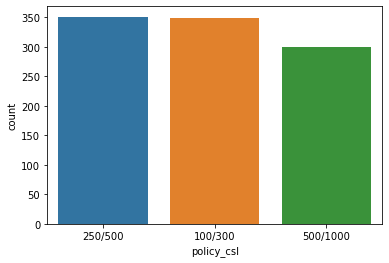

In [12]:
sns.countplot(df['policy_csl'])

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

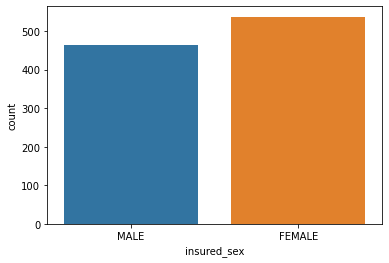

In [13]:
sns.countplot(df['insured_sex'])

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

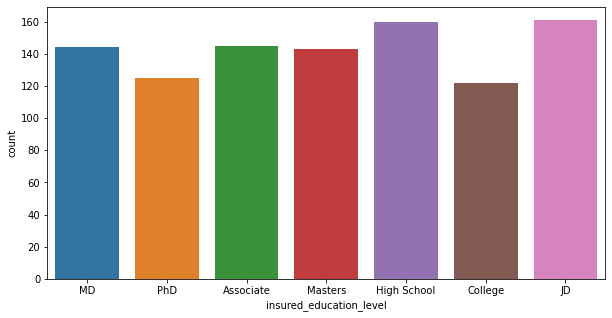

In [14]:
plt.figure(figsize=(10,5))
sns.countplot(df['insured_education_level'])

<AxesSubplot:xlabel='insured_hobbies', ylabel='count'>

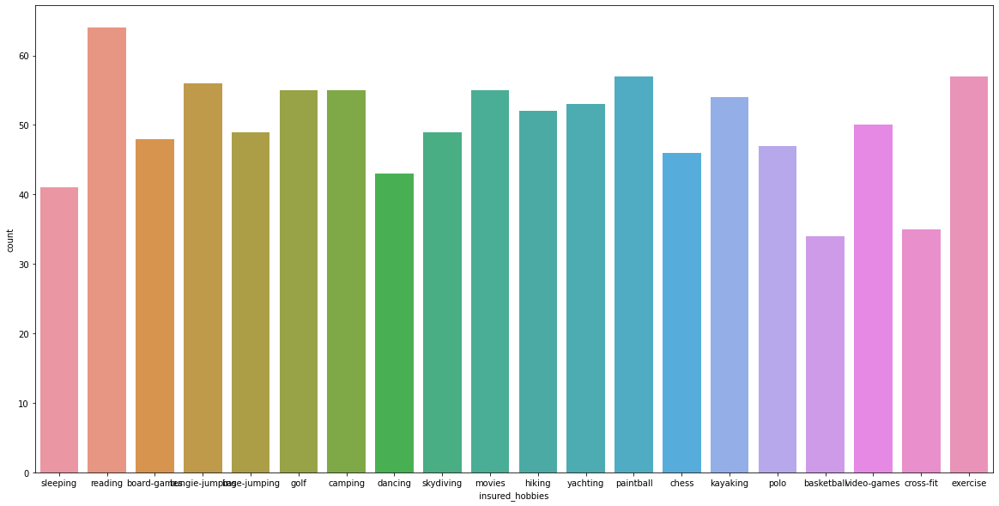

In [15]:
plt.figure(figsize=(20,10))
sns.countplot(df['insured_hobbies'])

<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

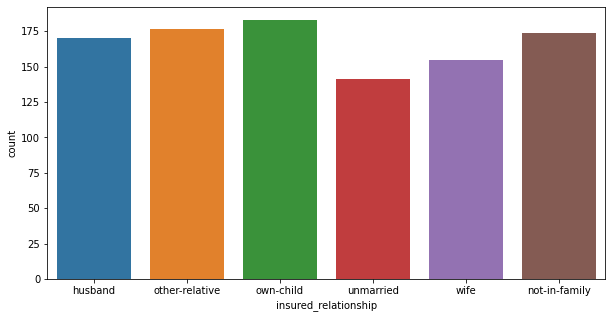

In [16]:
plt.figure(figsize=(10,5))
sns.countplot(df['insured_relationship'])

<AxesSubplot:xlabel='incident_type', ylabel='count'>

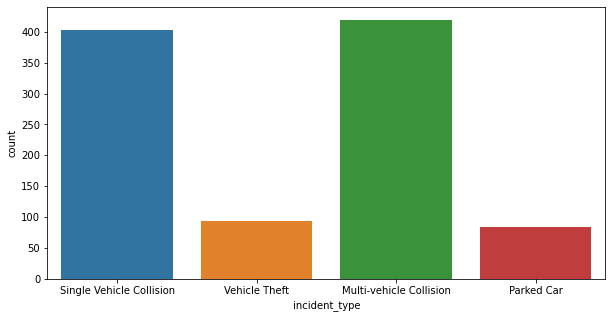

In [17]:
plt.figure(figsize=(10,5))
sns.countplot(df['incident_type'])

<AxesSubplot:xlabel='collision_type', ylabel='count'>

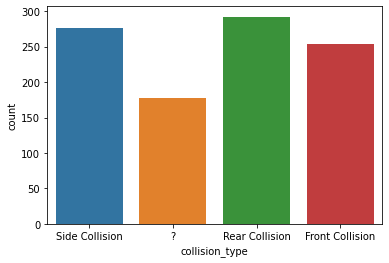

In [18]:
sns.countplot(df['collision_type'])

<AxesSubplot:xlabel='incident_severity', ylabel='count'>

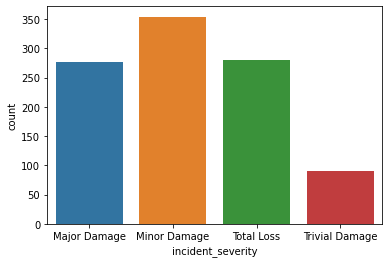

In [19]:
sns.countplot(df['incident_severity'])

<AxesSubplot:xlabel='authorities_contacted', ylabel='count'>

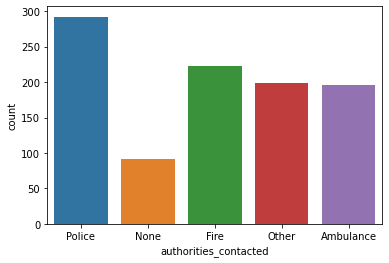

In [20]:
sns.countplot(df['authorities_contacted'])

<AxesSubplot:xlabel='incident_state', ylabel='count'>

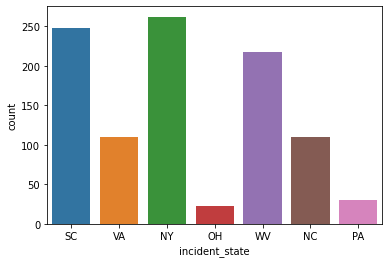

In [21]:
sns.countplot(df['incident_state'])

<AxesSubplot:xlabel='incident_state', ylabel='count'>

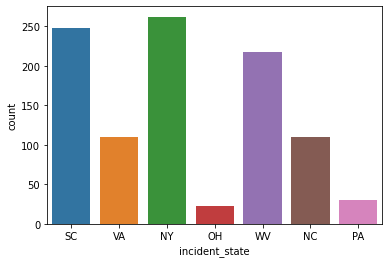

In [22]:
sns.countplot(df['incident_state'])

<AxesSubplot:xlabel='property_damage', ylabel='count'>

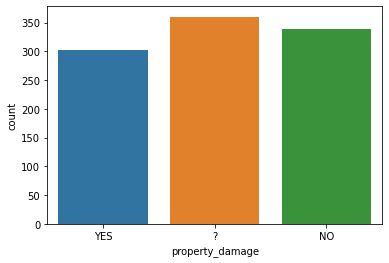

In [23]:
sns.countplot(df['property_damage'])

<AxesSubplot:xlabel='police_report_available', ylabel='count'>

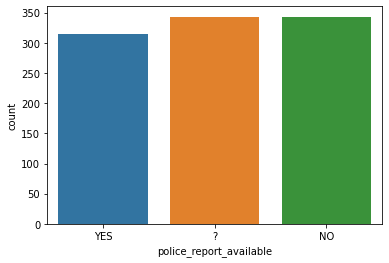

In [24]:
sns.countplot(df['police_report_available'])

<AxesSubplot:xlabel='auto_make', ylabel='count'>

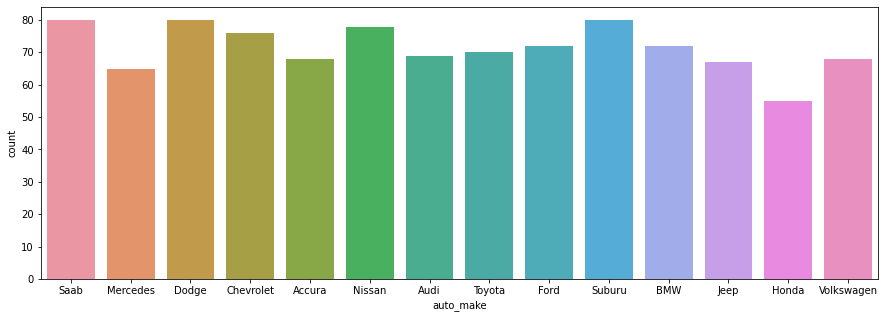

In [25]:
plt.figure(figsize=(15,5))
sns.countplot(df['auto_make'])

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

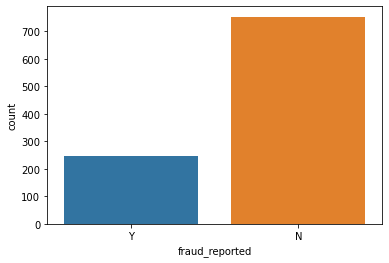

In [26]:
sns.countplot(df['fraud_reported'])

In [27]:
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

Here, the target variable is imbalanced.

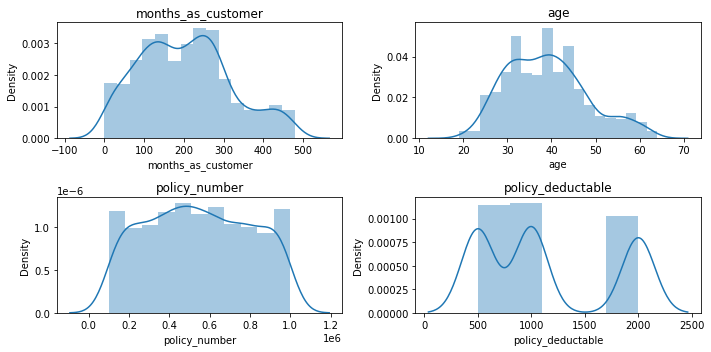

In [28]:
k=['months_as_customer','age','policy_number','policy_deductable']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

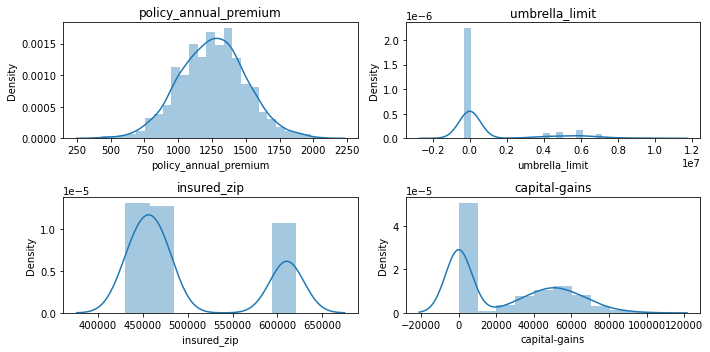

In [29]:
k=['policy_annual_premium','umbrella_limit','insured_zip','capital-gains']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

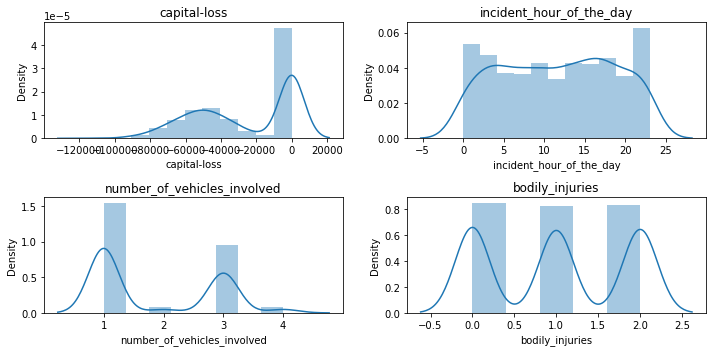

In [30]:
k=['capital-loss','incident_hour_of_the_day','number_of_vehicles_involved','bodily_injuries']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

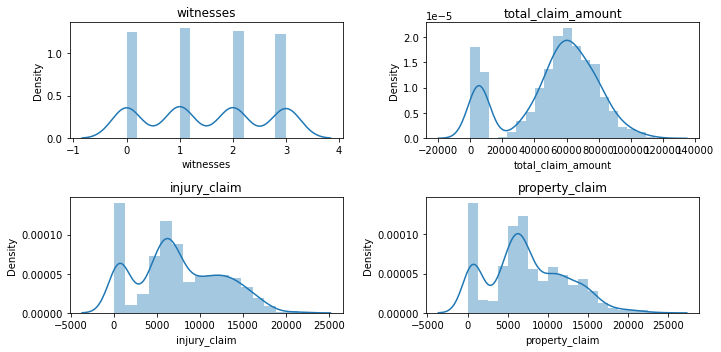

In [31]:
k=['witnesses','total_claim_amount','injury_claim','property_claim']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

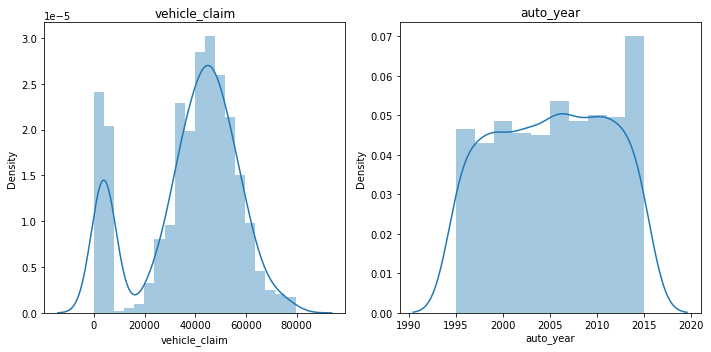

In [32]:
k=['vehicle_claim','auto_year']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(1,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

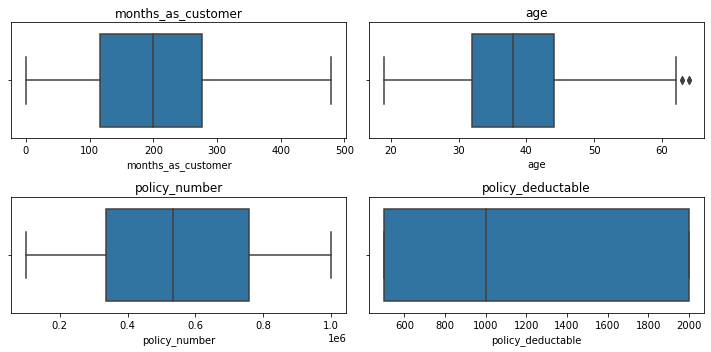

In [33]:
k=['months_as_customer','age','policy_number','policy_deductable']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

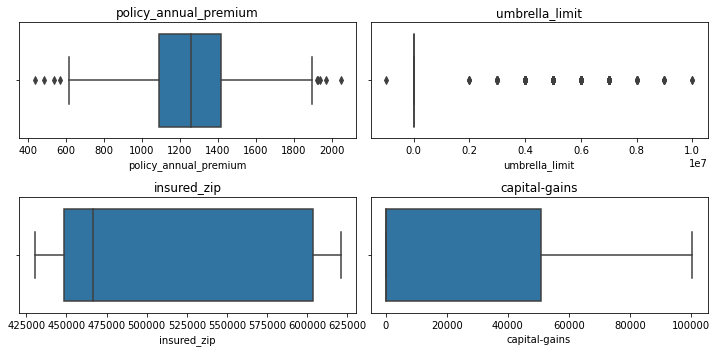

In [34]:
k=['policy_annual_premium','umbrella_limit','insured_zip','capital-gains']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

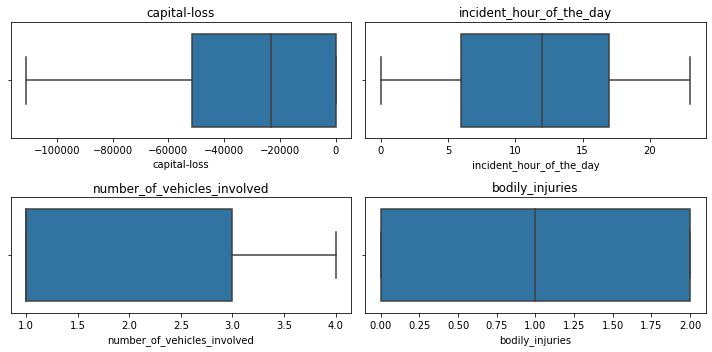

In [35]:
k=['capital-loss','incident_hour_of_the_day','number_of_vehicles_involved','bodily_injuries']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

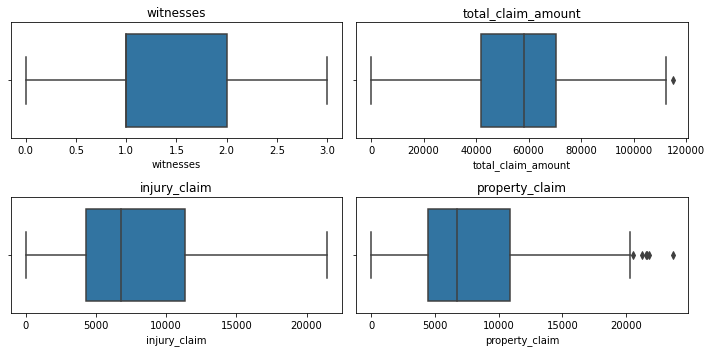

In [36]:
k=['witnesses','total_claim_amount','injury_claim','property_claim']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

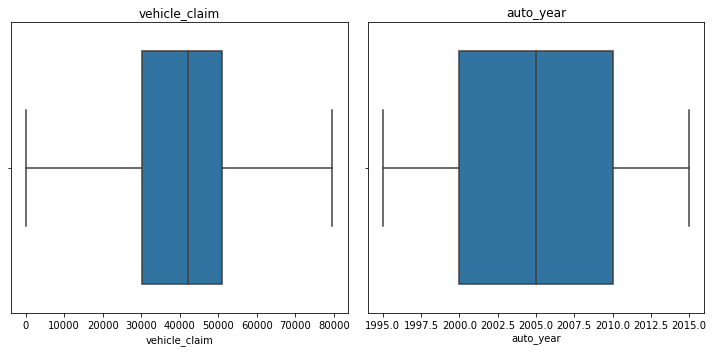

In [37]:
k=['vehicle_claim','auto_year']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(1,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

In [38]:
y=df[['fraud_reported']]

In [39]:
df.drop('fraud_reported',axis=1,inplace=True)

In [40]:
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
dtype: float64

In [41]:
df_new=df.copy(deep=True)

<AxesSubplot:xlabel='insured_zip', ylabel='Density'>

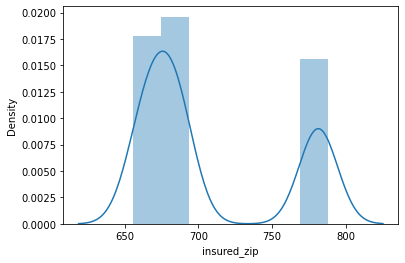

In [42]:
df_new['insured_zip']=np.sqrt(df_new['insured_zip'])
sns.distplot(df_new['insured_zip'])

In [43]:
df_new.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.800369
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
dtype: float64

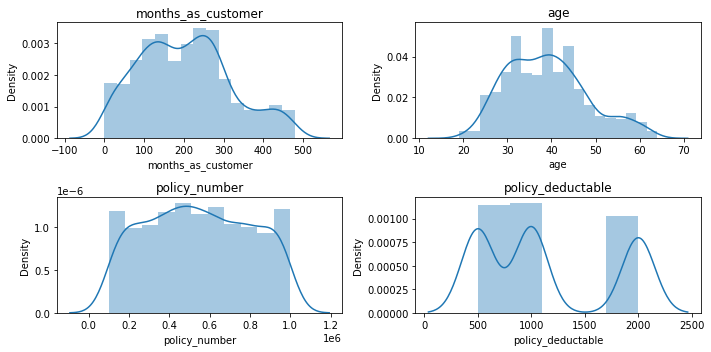

In [44]:
k=['months_as_customer','age','policy_number','policy_deductable']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

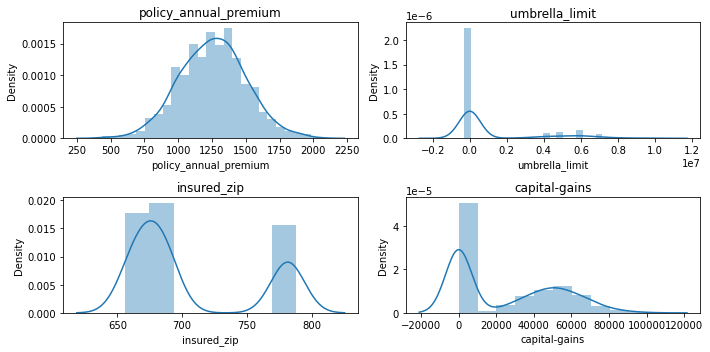

In [45]:
k=['policy_annual_premium','umbrella_limit','insured_zip','capital-gains']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

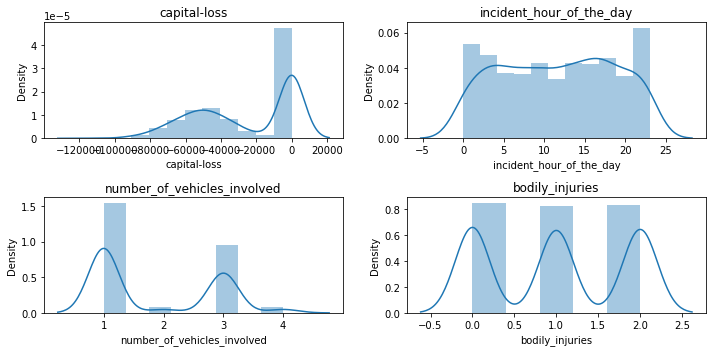

In [46]:
k=['capital-loss','incident_hour_of_the_day','number_of_vehicles_involved','bodily_injuries']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

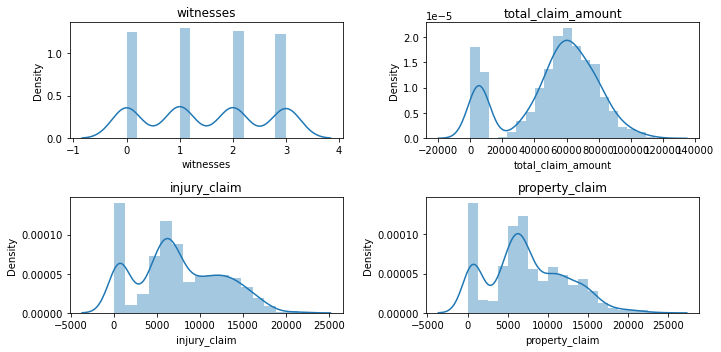

In [47]:
k=['witnesses','total_claim_amount','injury_claim','property_claim']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.distplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

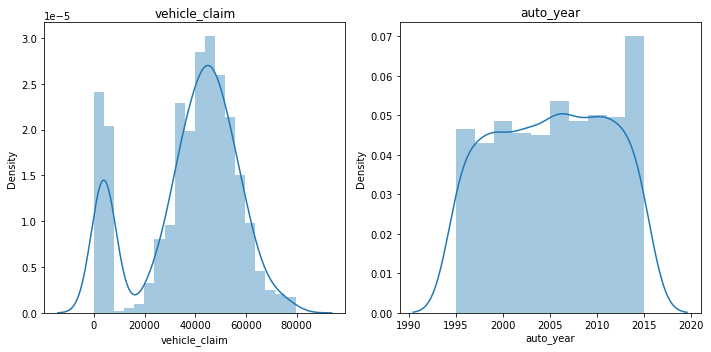

In [48]:
k=['vehicle_claim','auto_year']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(1,2,j)
    sns.distplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

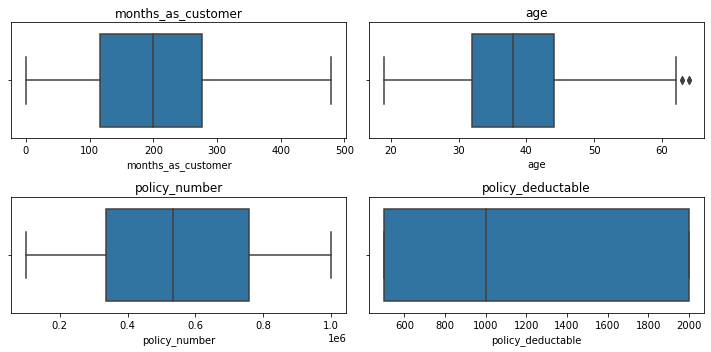

In [49]:
k=['months_as_customer','age','policy_number','policy_deductable']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

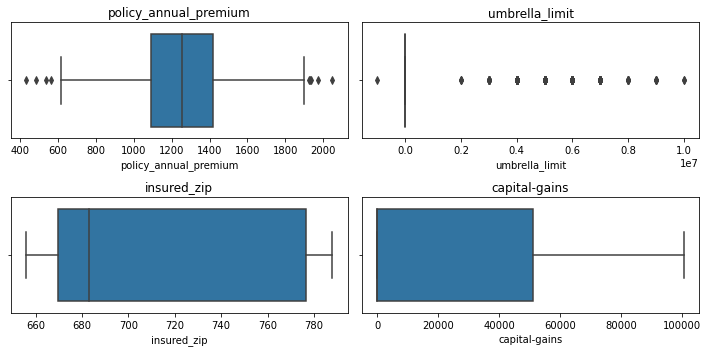

In [50]:
k=['policy_annual_premium','umbrella_limit','insured_zip','capital-gains']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

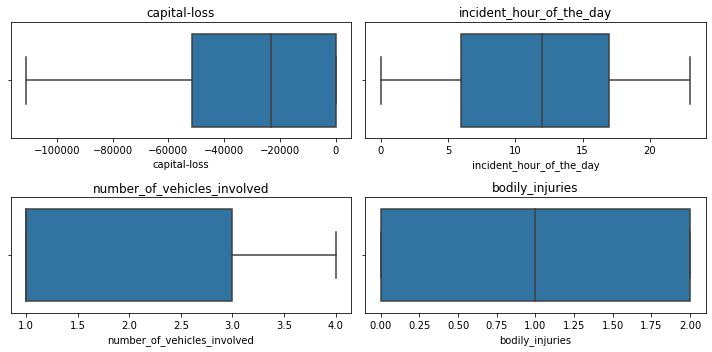

In [51]:
k=['capital-loss','incident_hour_of_the_day','number_of_vehicles_involved','bodily_injuries']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout()  

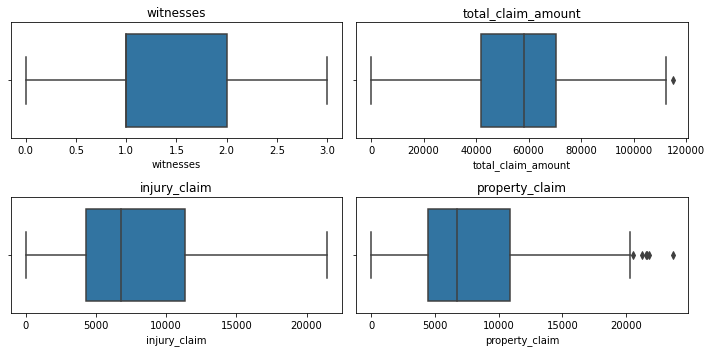

In [52]:
k=['witnesses','total_claim_amount','injury_claim','property_claim']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(2,2,j)
    sns.boxplot(df[i])
    plt.title(i)
    j=j+1
plt.tight_layout() 

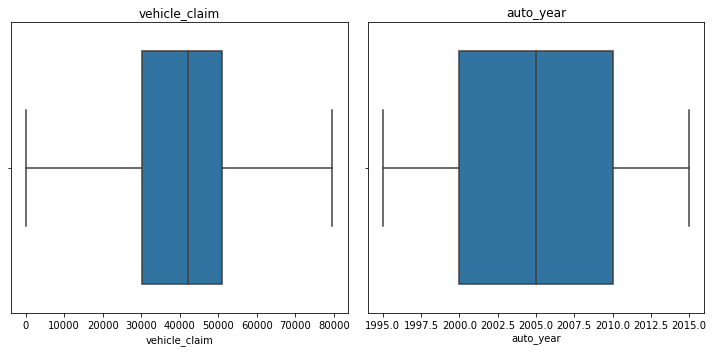

In [53]:
k=['vehicle_claim','auto_year']
j=1
plt.figure(figsize=(10,5))
for i in k:
    plt.subplot(1,2,j)
    sns.boxplot(df_new[i])
    plt.title(i)
    j=j+1
plt.tight_layout() 

In [54]:
df_new

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,682.738603,...,1,2,YES,71610,6510,13020,52080,Saab,92x,2004
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,684.233878,...,0,0,?,5070,780,780,3510,Mercedes,E400,2007
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,656.225571,...,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,779.818569,...,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,781.476807,...,0,1,NO,6500,1300,650,4550,Accura,RSX,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,656.725970,...,0,1,?,87200,17440,8720,61040,Honda,Accord,2006
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,779.857038,...,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,665.429936,...,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,664.615678,...,0,1,YES,46980,5220,5220,36540,Audi,A5,1998


In [55]:
df_new['fraud_reported']=y['fraud_reported']
df_new

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,682.738603,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,684.233878,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,656.225571,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,779.818569,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,781.476807,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,656.725970,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,779.857038,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,665.429936,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,664.615678,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [56]:
df_new.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)
df_new

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,OH,250/500,1000,1406.91,0,682.738603,MALE,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,IN,250/500,2000,1197.22,5000000,684.233878,MALE,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,OH,100/300,2000,1413.14,5000000,656.225571,FEMALE,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,IL,250/500,2000,1415.74,6000000,779.818569,FEMALE,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,IL,500/1000,1000,1583.91,6000000,781.476807,MALE,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,OH,500/1000,1000,1310.80,0,656.725970,FEMALE,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,IL,100/300,1000,1436.79,0,779.857038,FEMALE,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,OH,250/500,500,1383.49,3000000,665.429936,FEMALE,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,IL,500/1000,2000,1356.92,5000000,664.615678,MALE,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [57]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df_new['policy_state']=le.fit_transform(df_new['policy_state'])
df_new['policy_csl']=le.fit_transform(df_new['policy_csl'])
df_new['insured_sex']=le.fit_transform(df_new['insured_sex'])
df_new['insured_education_level']=le.fit_transform(df_new['insured_education_level'])
df_new['insured_occupation']=le.fit_transform(df_new['insured_occupation'])
df_new['insured_hobbies']=le.fit_transform(df_new['insured_hobbies'])
df_new['insured_relationship']=le.fit_transform(df_new['insured_relationship'])
df_new['incident_type']=le.fit_transform(df_new['incident_type'])
df_new['collision_type']=le.fit_transform(df_new['collision_type'])
df_new['incident_severity']=le.fit_transform(df_new['incident_severity'])
df_new['authorities_contacted']=le.fit_transform(df_new['authorities_contacted'])
df_new['incident_state']=le.fit_transform(df_new['incident_state'])
df_new['incident_city']=le.fit_transform(df_new['incident_city'])
df_new['incident_location']=le.fit_transform(df_new['incident_location'])
df_new['property_damage']=le.fit_transform(df_new['property_damage'])
df_new['police_report_available']=le.fit_transform(df_new['police_report_available'])
df_new['auto_make']=le.fit_transform(df_new['auto_make'])
df_new['auto_model']=le.fit_transform(df_new['auto_model'])
df_new['fraud_reported']=le.fit_transform(df_new['fraud_reported'])
df_new

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2,1,1000,1406.91,0,682.738603,1,...,2,2,71610,6510,13020,52080,10,1,2004,1
1,228,42,342868,1,1,2000,1197.22,5000000,684.233878,1,...,0,0,5070,780,780,3510,8,12,2007,1
2,134,29,687698,2,0,2000,1413.14,5000000,656.225571,0,...,3,1,34650,7700,3850,23100,4,30,2007,0
3,256,41,227811,0,1,2000,1415.74,6000000,779.818569,0,...,2,1,63400,6340,6340,50720,3,34,2014,1
4,228,44,367455,0,2,1000,1583.91,6000000,781.476807,1,...,1,1,6500,1300,650,4550,0,31,2009,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,2,2,1000,1310.80,0,656.725970,0,...,1,0,87200,17440,8720,61040,6,6,2006,0
996,285,41,186934,0,0,1000,1436.79,0,779.857038,0,...,3,0,108480,18080,18080,72320,13,28,2015,0
997,130,34,918516,2,1,500,1383.49,3000000,665.429936,0,...,3,2,67500,7500,7500,52500,11,19,1996,0
998,458,62,533940,0,2,2000,1356.92,5000000,664.615678,1,...,1,2,46980,5220,5220,36540,1,5,1998,0


In [58]:
from sklearn.utils import resample

In [59]:
train_positive=df_new[df_new['fraud_reported']==1]
train_negative=df_new[df_new['fraud_reported']==0]

# Upsample minority class
train_positive_upsample=resample(train_positive,replace=True,n_samples=753,random_state=18)

# Combine majority class with upsampled minority class
df1=pd.concat([train_negative,train_positive_upsample])

# Display new class counts
df1['fraud_reported'].value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

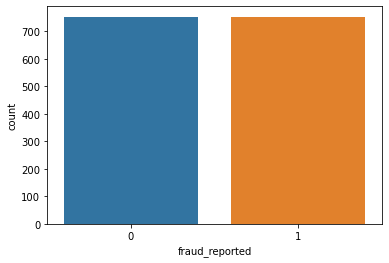

In [60]:
sns.countplot(df1['fraud_reported'])

In [61]:
df1

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
2,134,29,687698,2,0,2000,1413.14,5000000,656.225571,0,...,3,1,34650,7700,3850,23100,4,30,2007,0
4,228,44,367455,0,2,1000,1583.91,6000000,781.476807,1,...,1,1,6500,1300,650,4550,0,31,2009,0
6,137,34,413978,1,1,1000,1333.35,0,664.617183,1,...,0,0,78650,21450,7150,50050,9,29,2012,0
7,165,37,429027,0,0,1000,1137.03,0,776.656295,1,...,2,2,51590,9380,9380,32830,1,5,2015,0
8,27,33,485665,0,0,500,1442.99,0,775.715154,0,...,1,2,27700,2770,2770,22160,12,9,2012,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,239,39,730819,1,1,2000,625.08,0,661.177737,0,...,3,2,87890,15980,7990,63920,2,38,2014,1
379,157,32,347984,2,0,2000,617.11,0,660.841131,1,...,2,1,50800,10160,5080,35560,8,12,2013,1
579,51,34,641934,2,2,500,1430.80,0,679.164192,1,...,3,1,64200,6420,19260,38520,6,10,2007,1
128,274,43,517240,2,0,2000,1352.31,0,682.101899,1,...,3,2,63840,10640,10640,42560,2,37,2006,1


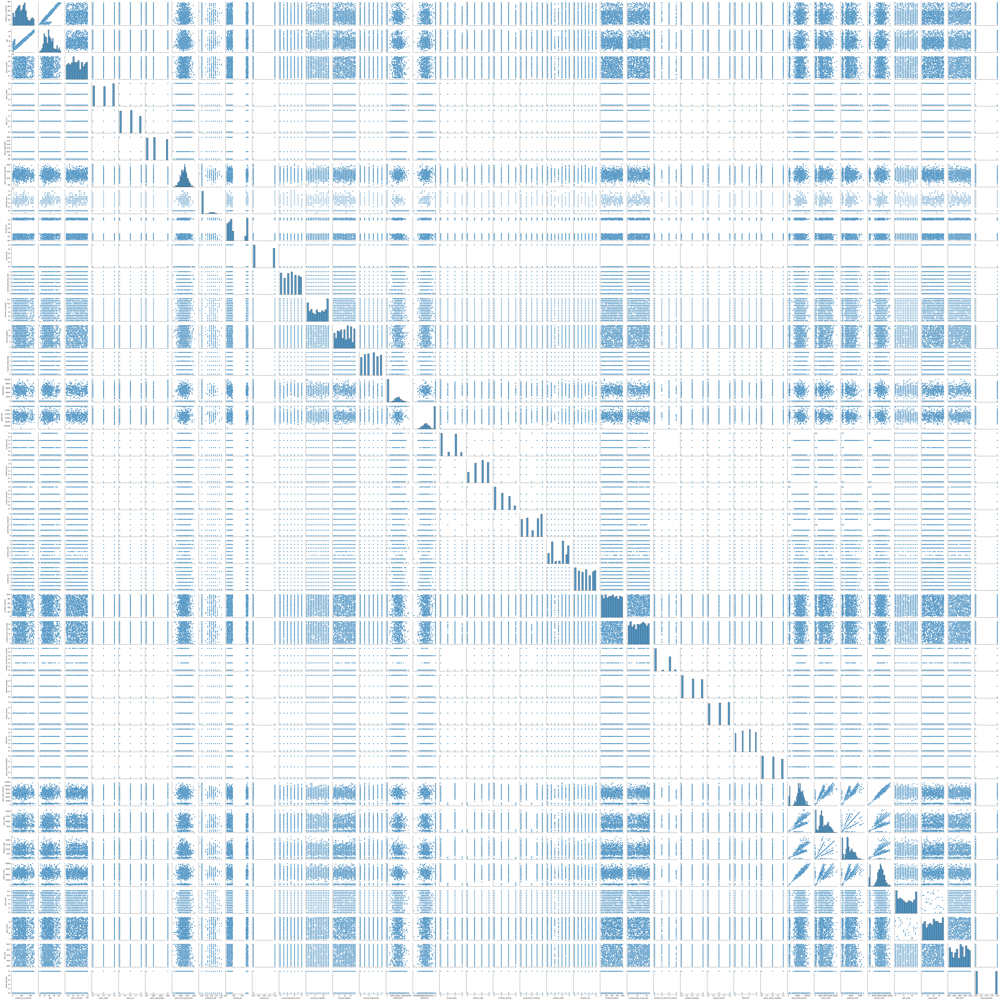

In [62]:
sns.pairplot(df1)

<AxesSubplot:xlabel='age', ylabel='Count'>

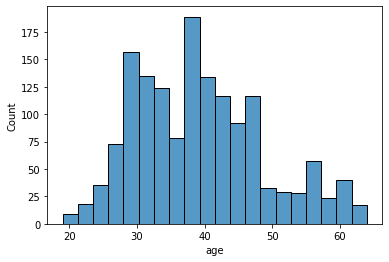

In [63]:
sns.histplot(df1['age'])

<AxesSubplot:xlabel='policy_annual_premium', ylabel='Count'>

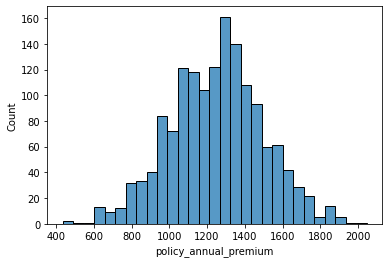

In [64]:
sns.histplot(df1['policy_annual_premium'])

In [66]:
df1.shape

(1506, 37)

In [67]:
x=df1.iloc[:,0:-1]
y=df1.iloc[:,-1]

In [68]:
x

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
2,134,29,687698,2,0,2000,1413.14,5000000,656.225571,0,...,2,3,1,34650,7700,3850,23100,4,30,2007
4,228,44,367455,0,2,1000,1583.91,6000000,781.476807,1,...,0,1,1,6500,1300,650,4550,0,31,2009
6,137,34,413978,1,1,1000,1333.35,0,664.617183,1,...,0,0,0,78650,21450,7150,50050,9,29,2012
7,165,37,429027,0,0,1000,1137.03,0,776.656295,1,...,2,2,2,51590,9380,9380,32830,1,5,2015
8,27,33,485665,0,0,500,1442.99,0,775.715154,0,...,1,1,2,27700,2770,2770,22160,12,9,2012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,239,39,730819,1,1,2000,625.08,0,661.177737,0,...,2,3,2,87890,15980,7990,63920,2,38,2014
379,157,32,347984,2,0,2000,617.11,0,660.841131,1,...,1,2,1,50800,10160,5080,35560,8,12,2013
579,51,34,641934,2,2,500,1430.80,0,679.164192,1,...,2,3,1,64200,6420,19260,38520,6,10,2007
128,274,43,517240,2,0,2000,1352.31,0,682.101899,1,...,0,3,2,63840,10640,10640,42560,2,37,2006


In [69]:
y

2      0
4      0
6      0
7      0
8      0
      ..
628    1
379    1
579    1
128    1
340    1
Name: fraud_reported, Length: 1506, dtype: int32

In [70]:
x.shape

(1506, 36)

In [71]:
y.shape

(1506,)

In [72]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [73]:
maxAcc=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    mod=DecisionTreeClassifier()
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print('The best accuracy is',maxAcc,'on random state',maxRS)        

The best accuracy is 0.9336283185840708 on random state 80


In [74]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=55)

In [75]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1054, 36)
(452, 36)
(1054,)
(452,)


In [76]:
lg=LogisticRegression()
lg.fit(x_train,y_train)

LogisticRegression()

In [77]:
pred=lg.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.5597345132743363
[[113 109]
 [ 90 140]]
              precision    recall  f1-score   support

           0       0.56      0.51      0.53       222
           1       0.56      0.61      0.58       230

    accuracy                           0.56       452
   macro avg       0.56      0.56      0.56       452
weighted avg       0.56      0.56      0.56       452



In [78]:
gnb=GaussianNB()
gnb.fit(x_train,y_train)
pred=gnb.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.5907079646017699
[[ 82 140]
 [ 45 185]]
              precision    recall  f1-score   support

           0       0.65      0.37      0.47       222
           1       0.57      0.80      0.67       230

    accuracy                           0.59       452
   macro avg       0.61      0.59      0.57       452
weighted avg       0.61      0.59      0.57       452



In [79]:
svc=SVC()
svc.fit(x_train,y_train)
pred=svc.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.5221238938053098
[[203  19]
 [197  33]]
              precision    recall  f1-score   support

           0       0.51      0.91      0.65       222
           1       0.63      0.14      0.23       230

    accuracy                           0.52       452
   macro avg       0.57      0.53      0.44       452
weighted avg       0.57      0.52      0.44       452



In [80]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred=dtc.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.9004424778761062
[[190  32]
 [ 13 217]]
              precision    recall  f1-score   support

           0       0.94      0.86      0.89       222
           1       0.87      0.94      0.91       230

    accuracy                           0.90       452
   macro avg       0.90      0.90      0.90       452
weighted avg       0.90      0.90      0.90       452



In [81]:
knn=KNeighborsClassifier(n_neighbors=3)
knn.fit(x_train,y_train)
pred=knn.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.6592920353982301
[[125  97]
 [ 57 173]]
              precision    recall  f1-score   support

           0       0.69      0.56      0.62       222
           1       0.64      0.75      0.69       230

    accuracy                           0.66       452
   macro avg       0.66      0.66      0.66       452
weighted avg       0.66      0.66      0.66       452



In [82]:
rf=RandomForestClassifier(n_estimators=100)
rf.fit(x_train,y_train)
pred=rf.predict(x_test)
print(accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.9358407079646017
[[202  20]
 [  9 221]]
              precision    recall  f1-score   support

           0       0.96      0.91      0.93       222
           1       0.92      0.96      0.94       230

    accuracy                           0.94       452
   macro avg       0.94      0.94      0.94       452
weighted avg       0.94      0.94      0.94       452



These accuracy scores can be because of overfitting. Lets check with cross validation.

# Cross Validation

In [83]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(lg,x,y,cv=5)
print(score)
print(score.mean())

[0.61258278 0.54817276 0.54817276 0.56810631 0.57142857]
0.56969263602561


In [84]:
score=cross_val_score(gnb,x,y,cv=5)
print(score)
print(score.mean())

[0.59271523 0.56146179 0.56810631 0.55481728 0.57142857]
0.5697058370552902


In [85]:
score=cross_val_score(svc,x,y,cv=5)
print(score)
print(score.mean())

[0.53311258 0.48837209 0.49169435 0.50498339 0.50166113]
0.5039647092473213


In [86]:
score=cross_val_score(dtc,x,y,cv=5)
print(score)
print(score.mean())

[0.90728477 0.9269103  0.91694352 0.92358804 0.93355482]
0.9216562891905568


In [87]:
score=cross_val_score(knn,x,y,cv=5)
print(score)
print(score.mean())

[0.74503311 0.69435216 0.6910299  0.70099668 0.67774086]
0.701830542782337


In [88]:
score=cross_val_score(rf,x,y,cv=5)
print(score)
print(score.mean())

[0.92384106 0.92026578 0.91362126 0.92358804 0.9269103 ]
0.9216452883324899


The least difference between the highest accuracy score and cross validation score says that decision tree model is working better.

# Hyper Parameter Tuning

We use this technique to improve the accuracy of the best model that we have choosen.

In [89]:
from sklearn.model_selection import GridSearchCV
parameters={'criterion':['gini','entropy'],
            'splitter':['best','random'],
            'max_depth':range(2,10,2),
            'min_samples_split':range(2,20,2),
            'max_features':['auto','sqrt','log2']}
gs=GridSearchCV(DecisionTreeClassifier(),parameters,cv=5)
gs.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 10, 2),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': range(2, 20, 2),
                         'splitter': ['best', 'random']})

In [90]:
print(gs.best_params_)

{'criterion': 'gini', 'max_depth': 8, 'max_features': 'sqrt', 'min_samples_split': 2, 'splitter': 'best'}


In [185]:
dtcbestmodel=DecisionTreeClassifier(criterion='gini',max_features='log2',min_samples_split=4,splitter='best')
dtcbestmodel.fit(x_train,y_train)
pred=dtcbestmodel.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

90.48672566371681


# Saving the model

In [474]:
import joblib
joblib.dump(dtc,'dtcbestmodel.obj')

['dtcbestmodel.obj']